<a href="https://www.kaggle.com/code/romikgosai2000/trainwithchangeinaugparamplaces365?scriptVersionId=165485494" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
!pip install deeplake

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 586.5/586.5 kB 8.9 MB/s eta 0:00:00
  Installing build dependencies ... - \ | / - done
  Getting requirements to build wheel ... - done
  Preparing metadata (pyproject.toml) ... - done
  Obtaining dependency information for humbug>=0.3.1 from https://files.pythonhosted.org/packages/c8/cc/c8129d6e9a1f473b5e90cf1b8eac43191a22657b9b673e02815548662270/humbug-0.3.2-py3-none-any.whl.metadata
  Obtaining dependency information for libdeeplake==0.0.104 from https://files.pythonhosted.org/packages/e8/cb/bd95db54bc1dd914b0bafa0154fc9cf4e8fa188d86b39330769e9e19b1c5/libdeeplake-0.0.104-cp310-cp310-manylinux2014_x86_64.whl.metadata
  Obtaining dependency information for aioboto3>=10.4.0 from https://files.pythonhosted.org/packages/2d/69/e375ee955f67eb468d5bc907423bdbdb39cbdd2012652e8abd98ba0bb255/aioboto3-12.3.0-py3-none-any.whl.metadata
  Obtaining dependency information for aiobotocore[boto3]==2.11.2 from https://files.pythonhosted.org/pa

In [6]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [7]:
x = load('/kaggle/input/places365/val_256/valid_samples/Places365_val_00000054.jpg')
print(x.shape)

(256, 256, 3)


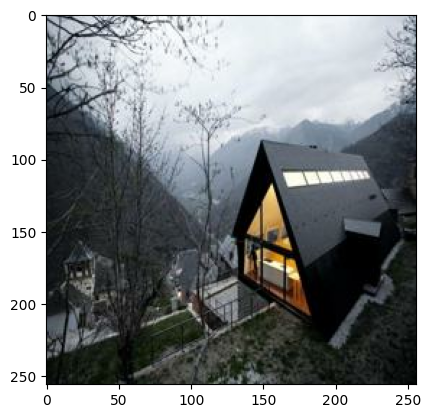

In [8]:
plt.imshow(x/255.0)

In [9]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [10]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

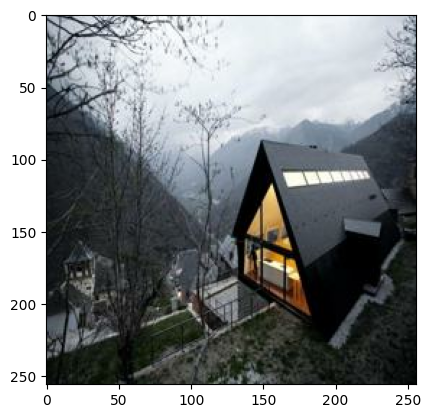

In [11]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [12]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [13]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [14]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

In [15]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

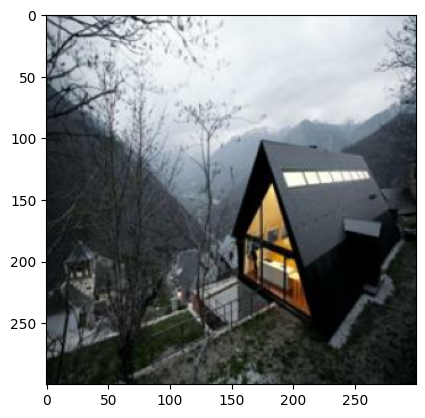

In [16]:
x = resize_with_aspect_ratio(x,300)
plt.imshow(x/255)

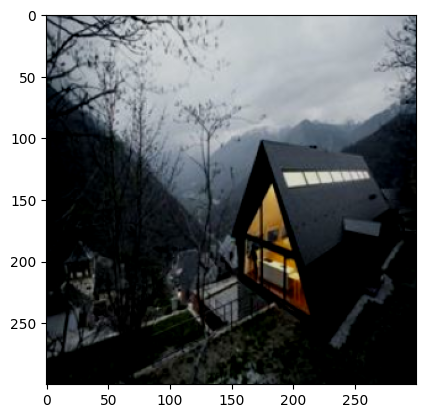

In [17]:
x_brightness = tf.image.random_brightness(x, 75)
plt.imshow(x_brightness/255)

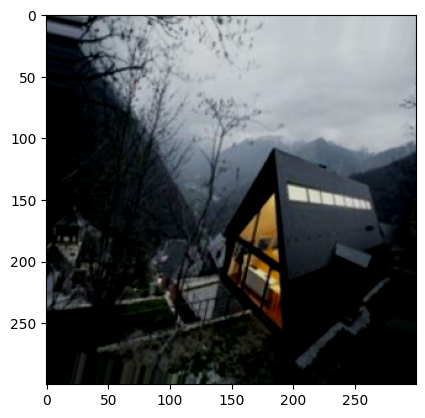

In [18]:
# Define the rotation angle in radians
rotation_angle = tf.random.uniform(shape=(), minval=-tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), maxval=tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), dtype=tf.float32)

# Apply the rotation using tfa.image.rotate
x_rotated = tfa.image.rotate(x_brightness, angles=rotation_angle,interpolation='bilinear', fill_mode='nearest')
plt.imshow(x_rotated/255)

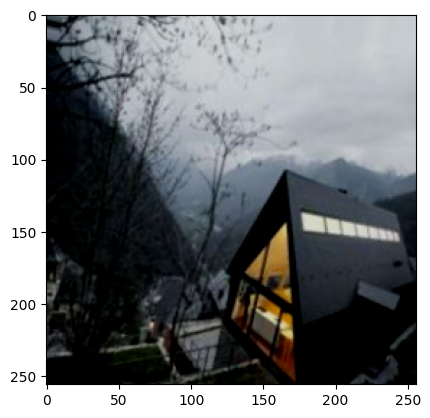

In [19]:
x_aug = random_crop(x_rotated)
plt.imshow(x_aug/255.0)

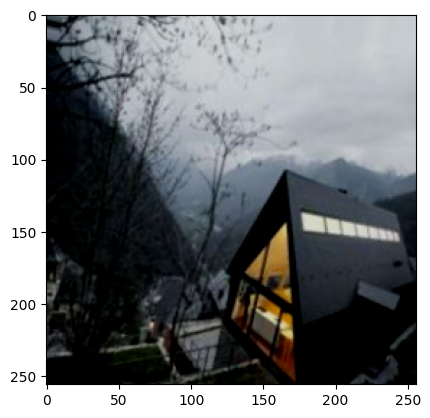

In [20]:
x_jitter = random_jitter(x_aug)
plt.imshow(x_jitter/255.0)

In [21]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 300)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 75)
    # Define the rotation angle in radians
    rotation_angle = tf.random.uniform(shape=(), minval=-tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), maxval=tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle,interpolation='bilinear', fill_mode='nearest')
    real_image = random_crop(real_image)
    

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [22]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [23]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [24]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files('/kaggle/input/places365/val_256/train_samples/*')
train_dataset = train_dataset.shuffle(10,reshuffle_each_iteration=True)
train_dataset = train_dataset.take(20000)
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset.cardinality().numpy()

1250

In [25]:
# create input pipeline
val = tf.data.Dataset.list_files('/kaggle/input/places365/val_256/valid_samples/*')
val = val.take(1000)
val = val.map(load_test_image)
val = val.shuffle(10).batch(BATCH_SIZE)
val.cardinality().numpy()

63

In [26]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [27]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 150, 150, 3)


In [28]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 300, 300, 3)


In [29]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

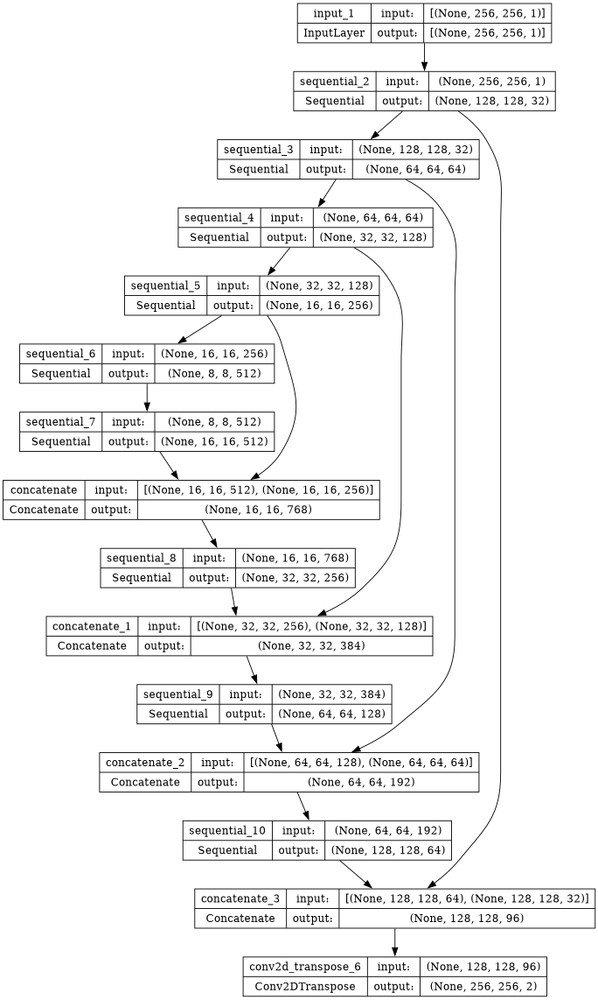

In [30]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [31]:
# gen.load_weights('/kaggle/input/feb28-coco/modelsFeb7/gen_weight.keras')

In [32]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

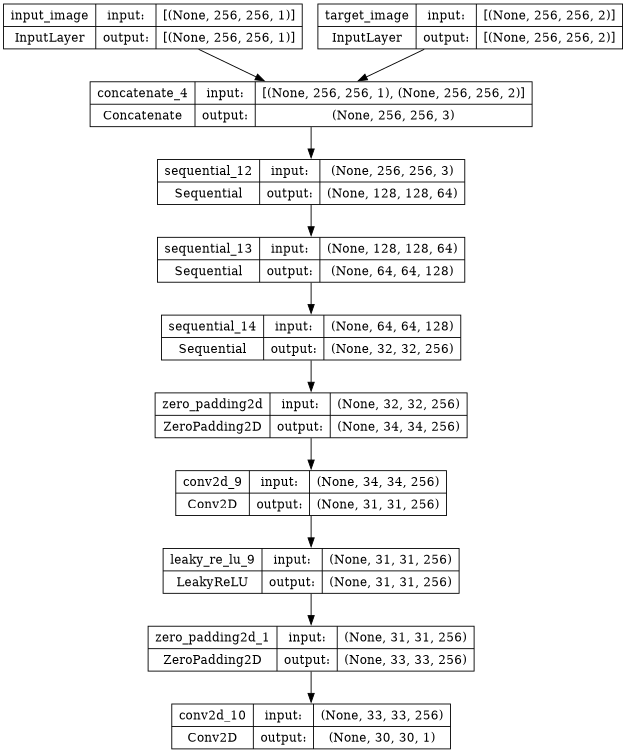

In [33]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [34]:
# disc.load_weights('/kaggle/input/feb28-coco/modelsFeb7/disc_wweight.keras')

In [35]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [36]:
LAMBDA = 150

In [37]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [38]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 150*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [39]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [40]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [41]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [42]:
epochs = 250

In [43]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [44]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [45]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [46]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [47]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [48]:
os.mkdir('/kaggle/working/gen_output/')

In [49]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [50]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image,256)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


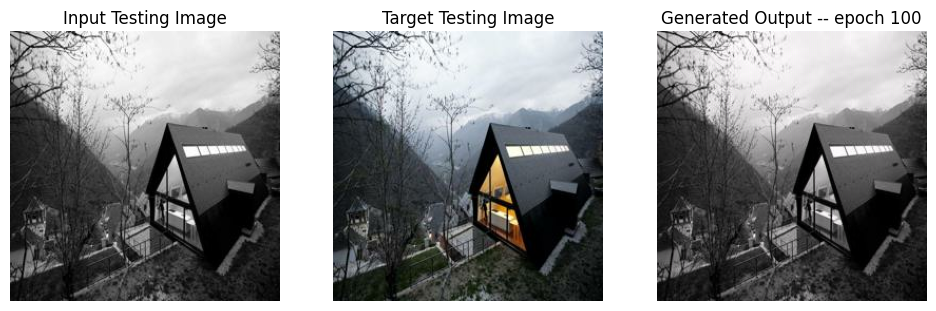

SSIM Score: 0.9761013388633728
PSNR Score: 29.864660263061523


In [51]:
display_random_test_image(gen, '/kaggle/input/places365/val_256/valid_samples/Places365_val_00000054.jpg',100)

In [52]:
os.mkdir('/kaggle/working/modelsFeb7')

In [53]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        gen.save('/kaggle/working/modelsFeb7/gen.h5')
        gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
        disc.save('/kaggle/working/modelsFeb7/disc.h5')
        disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')
        if time.time() - time_start > 41000:
            stop_training = True
#         if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
        display_random_test_image(gen, '/kaggle/input/places365/val_256/valid_samples/Places365_val_00000054.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [54]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 0s 0us/step
Training Details
Generator-- total_loss:10.92744 gan_loss:1.51987 l1_loss:0.05267 perceptual_loss:0.01005 Discriminator-- total_loss:1.14909 real_loss:0.56547 generated_loss:0.58362 --- SSIM 0.84768 PSNR 21.82492 LPIPS 0.00000
Time taken for epoch 1 is 1544.6213774681091 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:9.18763 gan_loss:0.78488 l1_loss:0.04744  perceptual_loss:0.00858 Discriminator-- total_loss:1.33633 real_loss:0.73387 generated_loss:0.60247 --- SSIM 0.92122 PSNR 22.44778 LPIPS 0.00000
Time taken for epoch 1 is 1587.1524405479431 sec
Number of iteration 63


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Displaying one random test image...


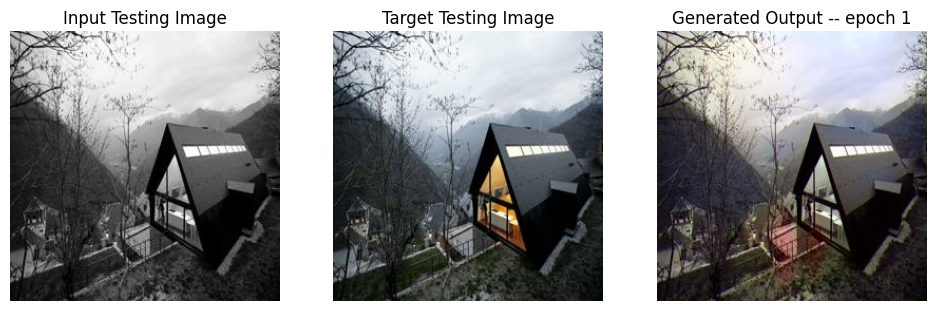

SSIM Score: 0.9562063217163086
PSNR Score: 27.752775192260742
Epoch 1
Training Details
Generator-- total_loss:10.44768 gan_loss:1.24222 l1_loss:0.05207 perceptual_loss:0.00930 Discriminator-- total_loss:1.20356 real_loss:0.58349 generated_loss:0.62007 --- SSIM 0.86798 PSNR 21.69303 LPIPS 0.00000
Time taken for epoch 2 is 1515.7404897212982 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:14.36447 gan_loss:0.57580 l1_loss:0.08226  perceptual_loss:0.00966 Discriminator-- total_loss:1.94071 real_loss:1.21930 generated_loss:0.72141 --- SSIM 0.86305 PSNR 18.18347 LPIPS 0.00000
Time taken for epoch 2 is 1558.8580651283264 sec
Number of iteration 63
Displaying one random test image...


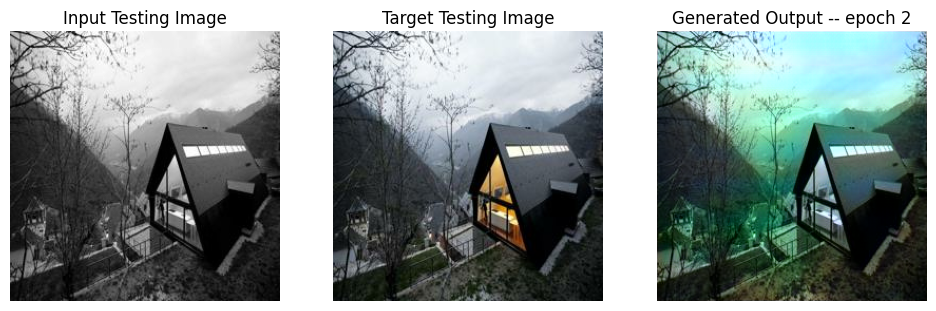

SSIM Score: 0.9236969351768494
PSNR Score: 20.5762996673584
Epoch 2
Training Details
Generator-- total_loss:10.38723 gan_loss:1.26777 l1_loss:0.05148 perceptual_loss:0.00931 Discriminator-- total_loss:1.16648 real_loss:0.55287 generated_loss:0.61361 --- SSIM 0.86927 PSNR 21.77411 LPIPS 0.00000
Time taken for epoch 3 is 1505.7551717758179 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:18.26126 gan_loss:0.90564 l1_loss:0.10295  perceptual_loss:0.01276 Discriminator-- total_loss:1.18179 real_loss:0.73485 generated_loss:0.44694 --- SSIM 0.79958 PSNR 16.29402 LPIPS 0.00000
Time taken for epoch 3 is 1546.2851371765137 sec
Number of iteration 63
Displaying one random test image...


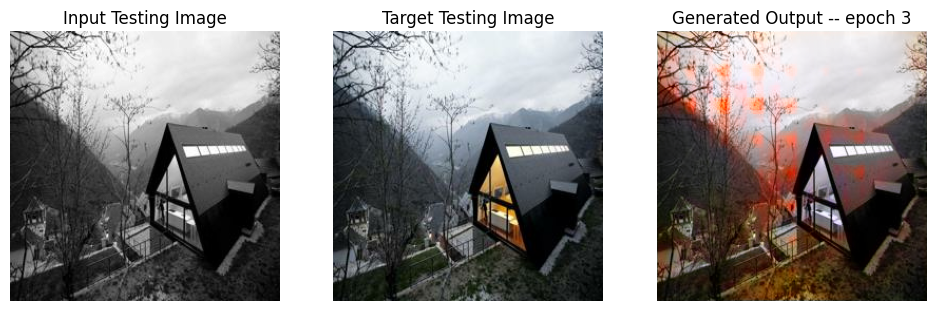

SSIM Score: 0.901717483997345
PSNR Score: 20.995702743530273
Epoch 3
Training Details
Generator-- total_loss:10.22940 gan_loss:1.20863 l1_loss:0.05086 perceptual_loss:0.00928 Discriminator-- total_loss:1.16881 real_loss:0.55854 generated_loss:0.61027 --- SSIM 0.87148 PSNR 21.84858 LPIPS 0.00000
Time taken for epoch 4 is 1494.1204326152802 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:10.70522 gan_loss:0.90172 l1_loss:0.05561  perceptual_loss:0.00975 Discriminator-- total_loss:1.29837 real_loss:0.58522 generated_loss:0.71315 --- SSIM 0.89814 PSNR 20.74324 LPIPS 0.00000
Time taken for epoch 4 is 1534.4697995185852 sec
Number of iteration 63
Displaying one random test image...


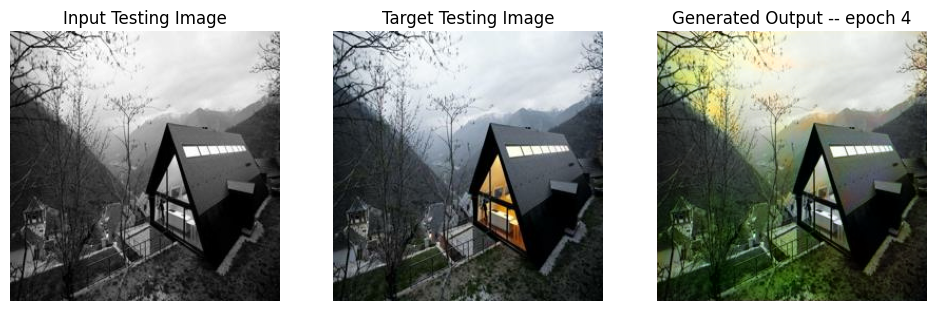

SSIM Score: 0.9428739547729492
PSNR Score: 23.583398818969727
Epoch 4
Training Details
Generator-- total_loss:10.17386 gan_loss:1.20167 l1_loss:0.05066 perceptual_loss:0.00916 Discriminator-- total_loss:1.15407 real_loss:0.54908 generated_loss:0.60498 --- SSIM 0.87361 PSNR 21.85542 LPIPS 0.00000
Time taken for epoch 5 is 1507.3360829353333 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:11.37591 gan_loss:2.63316 l1_loss:0.04958  perceptual_loss:0.00871 Discriminator-- total_loss:2.39037 real_loss:0.51013 generated_loss:1.88024 --- SSIM 0.91455 PSNR 22.14113 LPIPS 0.00000
Time taken for epoch 5 is 1547.7436044216156 sec
Number of iteration 63
Displaying one random test image...


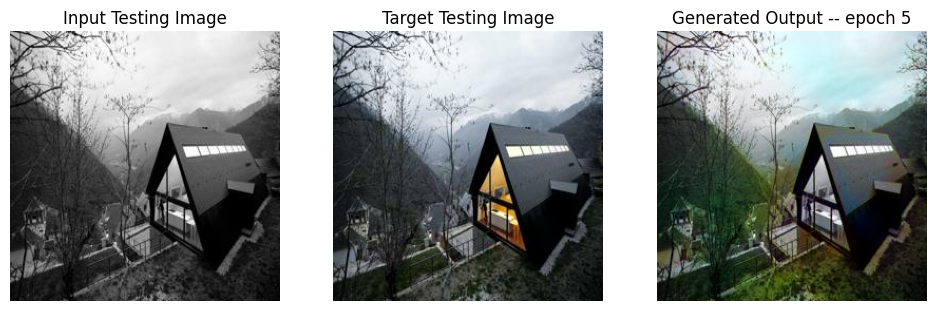

SSIM Score: 0.9488465189933777
PSNR Score: 26.58858299255371
Epoch 5
Training Details
Generator-- total_loss:10.18376 gan_loss:1.22201 l1_loss:0.05059 perceptual_loss:0.00915 Discriminator-- total_loss:1.15664 real_loss:0.55177 generated_loss:0.60487 --- SSIM 0.87149 PSNR 21.87113 LPIPS 0.00000
Time taken for epoch 6 is 1502.2475867271423 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:9.01448 gan_loss:0.44293 l1_loss:0.04832  perceptual_loss:0.00882 Discriminator-- total_loss:1.67347 real_loss:1.24533 generated_loss:0.42814 --- SSIM 0.91767 PSNR 22.55295 LPIPS 0.00000
Time taken for epoch 6 is 1542.8195502758026 sec
Number of iteration 63
Displaying one random test image...


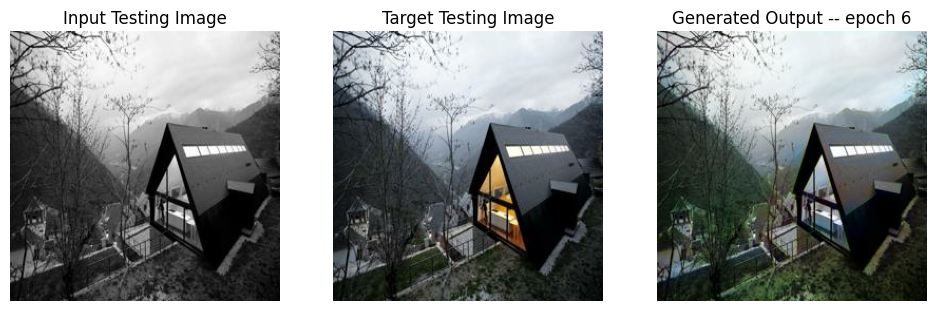

SSIM Score: 0.9656928181648254
PSNR Score: 28.712648391723633
Epoch 6
Training Details
Generator-- total_loss:10.11314 gan_loss:1.21265 l1_loss:0.05015 perceptual_loss:0.00919 Discriminator-- total_loss:1.14069 real_loss:0.53787 generated_loss:0.60282 --- SSIM 0.87228 PSNR 21.93616 LPIPS 0.00000
Time taken for epoch 7 is 1488.4621992111206 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:9.43144 gan_loss:0.43860 l1_loss:0.05126  perceptual_loss:0.00870 Discriminator-- total_loss:1.52180 real_loss:1.20349 generated_loss:0.31832 --- SSIM 0.89681 PSNR 21.81266 LPIPS 0.00000
Time taken for epoch 7 is 1529.2054286003113 sec
Number of iteration 63
Displaying one random test image...


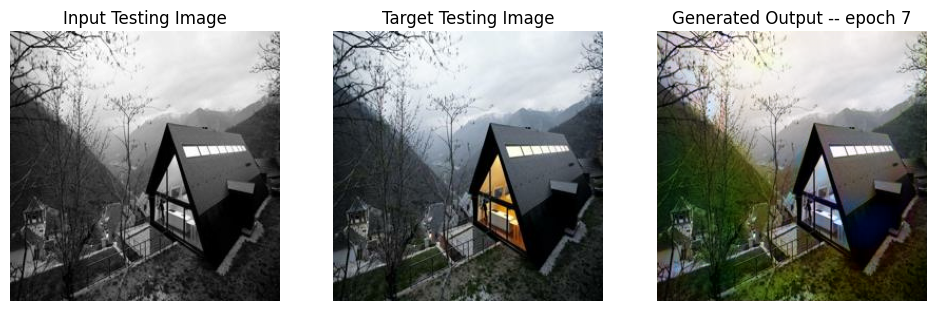

SSIM Score: 0.9014151692390442
PSNR Score: 24.51677703857422
Epoch 7
Training Details
Generator-- total_loss:10.13737 gan_loss:1.21195 l1_loss:0.05031 perceptual_loss:0.00920 Discriminator-- total_loss:1.14299 real_loss:0.54093 generated_loss:0.60206 --- SSIM 0.87226 PSNR 21.92883 LPIPS 0.00000
Time taken for epoch 8 is 1483.1749355793 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:38.19109 gan_loss:5.94854 l1_loss:0.19131  perceptual_loss:0.02364 Discriminator-- total_loss:1.41253 real_loss:0.25940 generated_loss:1.15313 --- SSIM 0.63452 PSNR 9.33558 LPIPS 0.00000
Time taken for epoch 8 is 1523.1059021949768 sec
Number of iteration 63
Displaying one random test image...


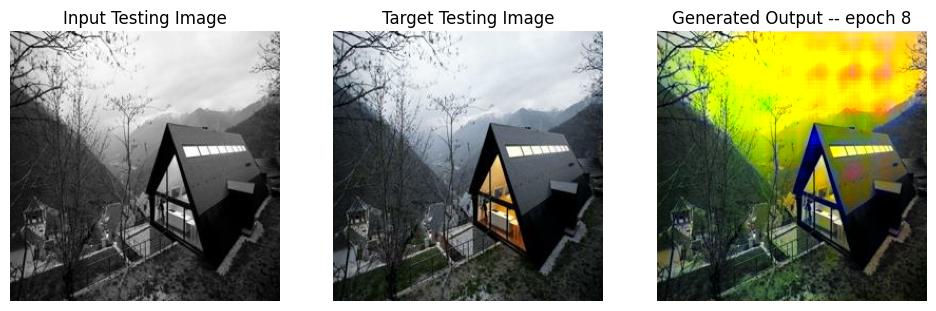

SSIM Score: 0.7351369261741638
PSNR Score: 7.485548496246338
Epoch 8
Training Details
Generator-- total_loss:10.14246 gan_loss:1.21389 l1_loss:0.05029 perceptual_loss:0.00924 Discriminator-- total_loss:1.13418 real_loss:0.53866 generated_loss:0.59552 --- SSIM 0.87048 PSNR 21.90935 LPIPS 0.00000
Time taken for epoch 9 is 1475.1464557647705 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:9.86194 gan_loss:0.71057 l1_loss:0.05225  perceptual_loss:0.00876 Discriminator-- total_loss:1.46229 real_loss:1.00336 generated_loss:0.45893 --- SSIM 0.91724 PSNR 21.80251 LPIPS 0.00000
Time taken for epoch 9 is 1515.7194390296936 sec
Number of iteration 63
Displaying one random test image...


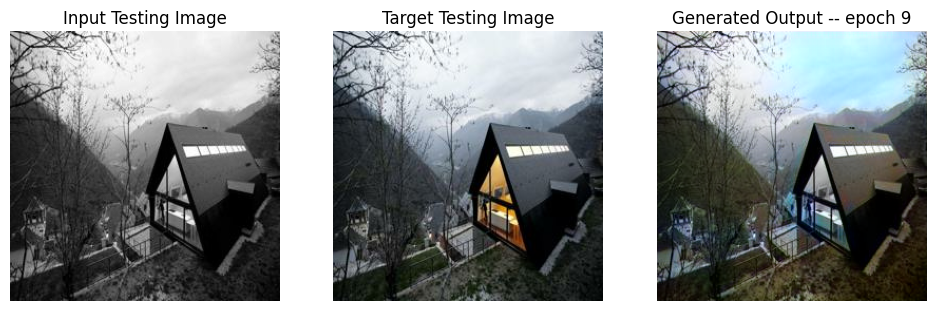

SSIM Score: 0.9479551315307617
PSNR Score: 24.491743087768555
Epoch 9
Training Details
Generator-- total_loss:9.00303 gan_loss:0.58005 l1_loss:0.04727 perceptual_loss:0.00889 Discriminator-- total_loss:1.43575 real_loss:1.15357 generated_loss:0.28217 --- SSIM 0.87996 PSNR 22.40040 LPIPS 0.00000
Time taken for epoch 10 is 1344.6867201328278 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.83843 gan_loss:0.33934 l1_loss:0.04187  perceptual_loss:0.00812 Discriminator-- total_loss:1.74593 real_loss:1.40790 generated_loss:0.33803 --- SSIM 0.93537 PSNR 23.67177 LPIPS 0.00000
Time taken for epoch 10 is 1384.8971450328827 sec
Number of iteration 63
Displaying one random test image...


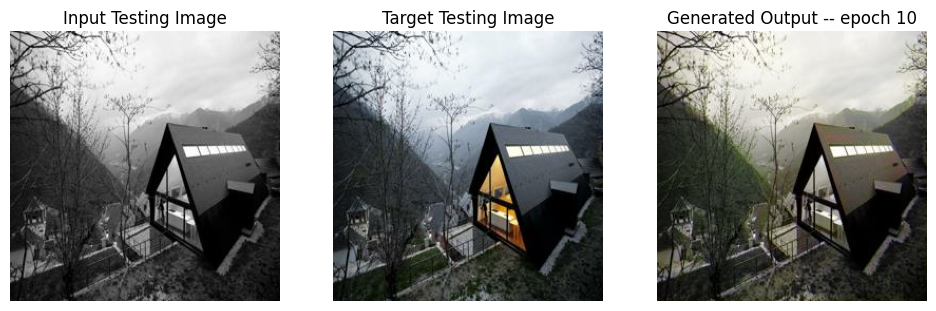

SSIM Score: 0.9743709564208984
PSNR Score: 27.00029754638672
Epoch 10
Training Details
Generator-- total_loss:8.83814 gan_loss:0.57169 l1_loss:0.04626 perceptual_loss:0.00885 Discriminator-- total_loss:1.45082 real_loss:1.15640 generated_loss:0.29442 --- SSIM 0.88269 PSNR 22.46683 LPIPS 0.00000
Time taken for epoch 11 is 1344.8176367282867 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.85443 gan_loss:0.33520 l1_loss:0.04851  perceptual_loss:0.00829 Discriminator-- total_loss:1.89030 real_loss:1.53209 generated_loss:0.35821 --- SSIM 0.91909 PSNR 22.26446 LPIPS 0.00000
Time taken for epoch 11 is 1384.9142758846283 sec
Number of iteration 63
Displaying one random test image...


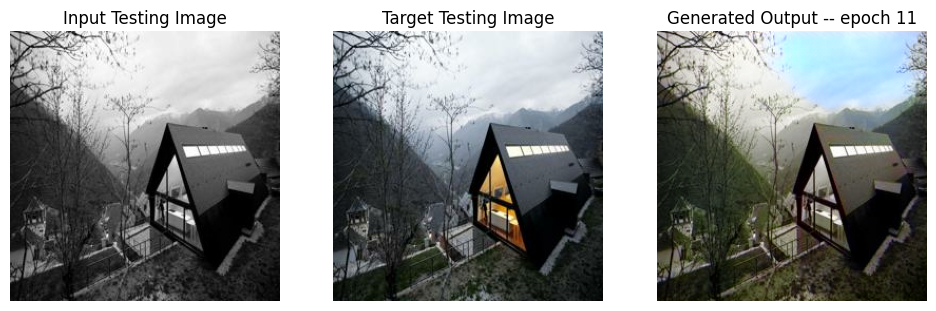

SSIM Score: 0.9503172039985657
PSNR Score: 22.65443992614746
Epoch 11
Training Details
Generator-- total_loss:16.83751 gan_loss:8.53456 l1_loss:0.04651 perceptual_loss:0.00884 Discriminator-- total_loss:0.03353 real_loss:0.01823 generated_loss:0.01530 --- SSIM 0.88105 PSNR 22.35400 LPIPS 0.00000
Time taken for epoch 12 is 1000.3782551288605 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.89659 gan_loss:1.35842 l1_loss:0.04224  perceptual_loss:0.00801 Discriminator-- total_loss:1.25633 real_loss:0.60280 generated_loss:0.65354 --- SSIM 0.93073 PSNR 23.48023 LPIPS 0.00000
Time taken for epoch 12 is 1040.292385816574 sec
Number of iteration 63
Displaying one random test image...


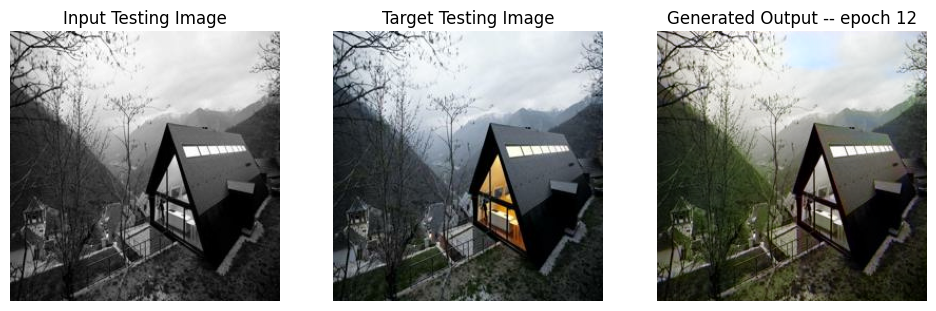

SSIM Score: 0.9640300273895264
PSNR Score: 27.047828674316406
Epoch 12
Training Details
Generator-- total_loss:19.47459 gan_loss:11.18580 l1_loss:0.04641 perceptual_loss:0.00885 Discriminator-- total_loss:0.00340 real_loss:0.00203 generated_loss:0.00137 --- SSIM 0.88127 PSNR 22.32949 LPIPS 0.00000
Time taken for epoch 13 is 994.4810965061188 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.82425 gan_loss:1.23236 l1_loss:0.04260  perceptual_loss:0.00801 Discriminator-- total_loss:1.20431 real_loss:0.72084 generated_loss:0.48347 --- SSIM 0.93019 PSNR 23.40161 LPIPS 0.00000
Time taken for epoch 13 is 1034.9860744476318 sec
Number of iteration 63
Displaying one random test image...


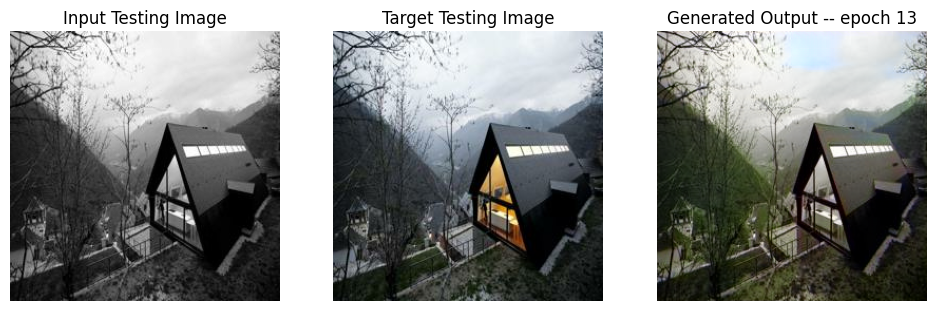

SSIM Score: 0.9640140533447266
PSNR Score: 27.039827346801758
Epoch 13
Training Details
Generator-- total_loss:20.25179 gan_loss:11.96089 l1_loss:0.04646 perceptual_loss:0.00881 Discriminator-- total_loss:0.11203 real_loss:0.04770 generated_loss:0.06433 --- SSIM 0.88144 PSNR 22.34312 LPIPS 0.00000
Time taken for epoch 14 is 998.9183044433594 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.20070 gan_loss:0.76639 l1_loss:0.04153  perceptual_loss:0.00803 Discriminator-- total_loss:1.54398 real_loss:1.11858 generated_loss:0.42540 --- SSIM 0.93238 PSNR 23.57756 LPIPS 0.00000
Time taken for epoch 14 is 1038.7171213626862 sec
Number of iteration 63
Displaying one random test image...


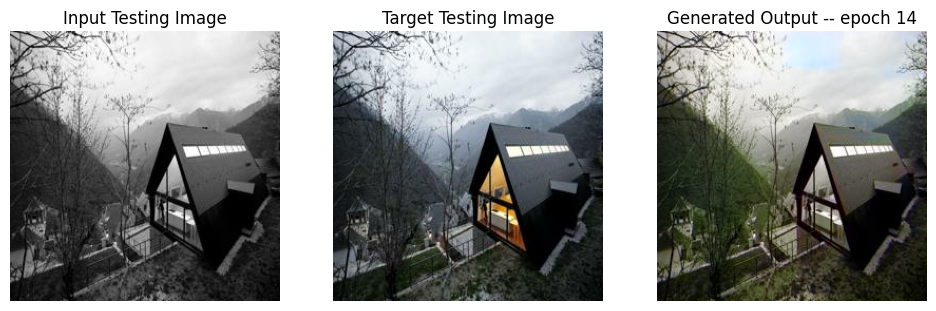

SSIM Score: 0.9629285335540771
PSNR Score: 26.95878028869629
Epoch 14
Training Details
Generator-- total_loss:22.29978 gan_loss:14.01125 l1_loss:0.04644 perceptual_loss:0.00881 Discriminator-- total_loss:0.00017 real_loss:0.00009 generated_loss:0.00007 --- SSIM 0.88313 PSNR 22.34346 LPIPS 0.00000
Time taken for epoch 15 is 999.0797247886658 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.65013 gan_loss:1.06738 l1_loss:0.04241  perceptual_loss:0.00814 Discriminator-- total_loss:3.23636 real_loss:2.31660 generated_loss:0.91977 --- SSIM 0.93054 PSNR 23.42986 LPIPS 0.00000
Time taken for epoch 15 is 1039.2264795303345 sec
Number of iteration 63
Displaying one random test image...


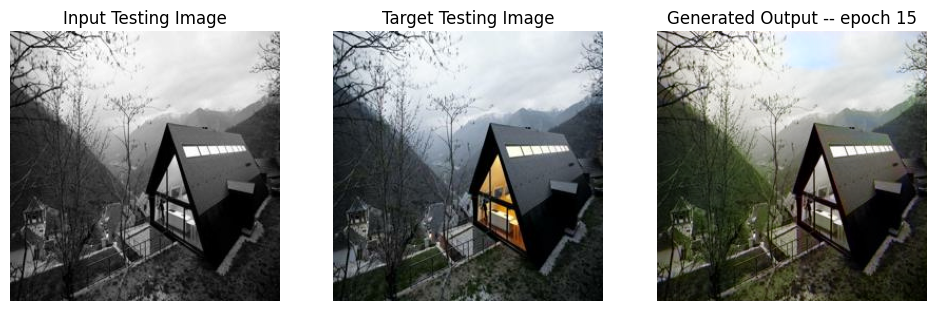

SSIM Score: 0.9646182656288147
PSNR Score: 27.104000091552734
Epoch 15
Training Details
Generator-- total_loss:23.42611 gan_loss:15.13258 l1_loss:0.04646 perceptual_loss:0.00883 Discriminator-- total_loss:0.00004 real_loss:0.00002 generated_loss:0.00002 --- SSIM 0.88248 PSNR 22.34892 LPIPS 0.00000
Time taken for epoch 16 is 997.0813283920288 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.22023 gan_loss:0.70705 l1_loss:0.04183  perceptual_loss:0.00825 Discriminator-- total_loss:2.69385 real_loss:2.24360 generated_loss:0.45025 --- SSIM 0.93160 PSNR 23.54203 LPIPS 0.00000
Time taken for epoch 16 is 1036.6854124069214 sec
Number of iteration 63
Displaying one random test image...


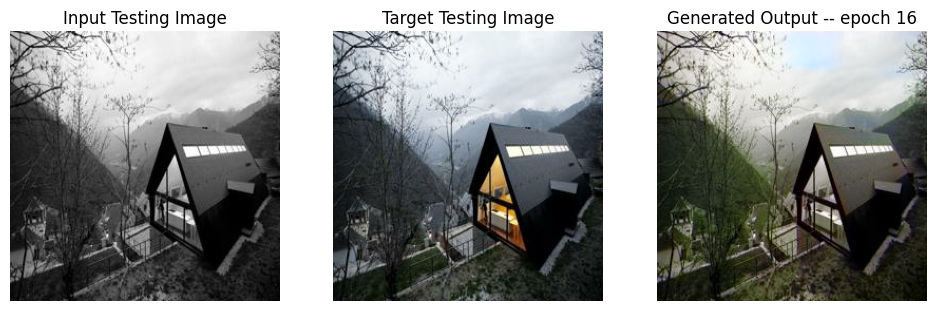

SSIM Score: 0.9648739695549011
PSNR Score: 27.122243881225586
Epoch 16
Training Details
Generator-- total_loss:24.00215 gan_loss:15.70816 l1_loss:0.04647 perceptual_loss:0.00883 Discriminator-- total_loss:0.13430 real_loss:0.07897 generated_loss:0.05532 --- SSIM 0.88195 PSNR 22.35027 LPIPS 0.00000
Time taken for epoch 17 is 998.7802813053131 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:11.00933 gan_loss:3.13817 l1_loss:0.04411  perceptual_loss:0.00836 Discriminator-- total_loss:2.67975 real_loss:0.68105 generated_loss:1.99870 --- SSIM 0.92651 PSNR 23.16354 LPIPS 0.00000
Time taken for epoch 17 is 1038.0052359104156 sec
Number of iteration 63
Displaying one random test image...


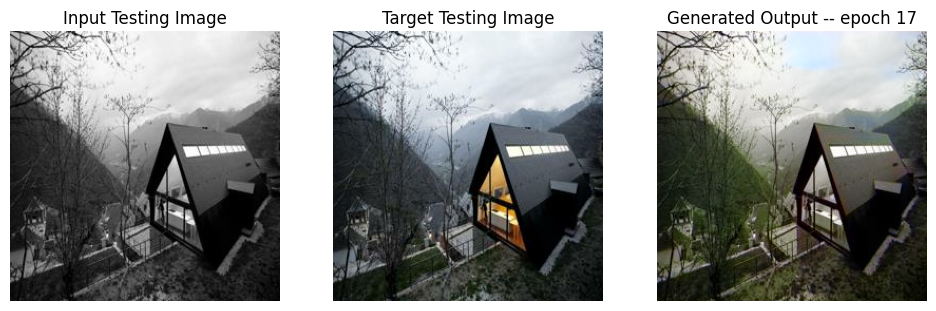

SSIM Score: 0.9642636179924011
PSNR Score: 27.067903518676758
Epoch 17
Training Details
Generator-- total_loss:23.02061 gan_loss:14.72241 l1_loss:0.04649 perceptual_loss:0.00883 Discriminator-- total_loss:0.01189 real_loss:0.00838 generated_loss:0.00351 --- SSIM 0.88126 PSNR 22.33333 LPIPS 0.00000
Time taken for epoch 18 is 999.9095144271851 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:9.96554 gan_loss:2.30962 l1_loss:0.04278  perceptual_loss:0.00826 Discriminator-- total_loss:2.46663 real_loss:0.85930 generated_loss:1.60733 --- SSIM 0.92754 PSNR 23.32869 LPIPS 0.00000
Time taken for epoch 18 is 1039.5186259746552 sec
Number of iteration 63
Displaying one random test image...


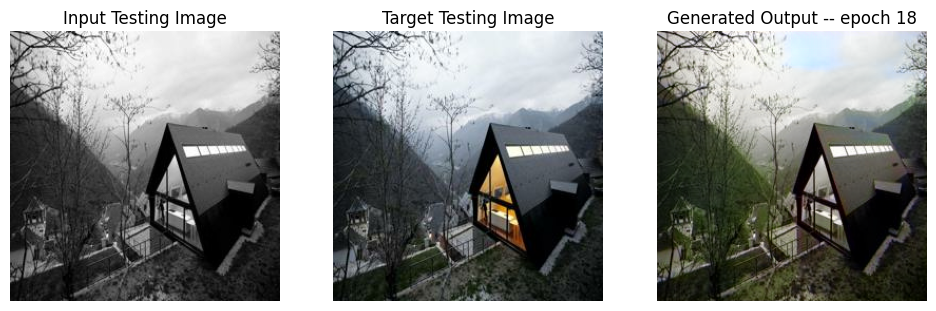

SSIM Score: 0.9633079171180725
PSNR Score: 26.977201461791992
Epoch 18
Training Details
Generator-- total_loss:22.59456 gan_loss:14.30131 l1_loss:0.04645 perceptual_loss:0.00883 Discriminator-- total_loss:0.00020 real_loss:0.00007 generated_loss:0.00013 --- SSIM 0.88243 PSNR 22.34010 LPIPS 0.00000
Time taken for epoch 19 is 1003.6620526313782 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:9.94586 gan_loss:2.61297 l1_loss:0.04080  perceptual_loss:0.00808 Discriminator-- total_loss:2.90557 real_loss:0.96861 generated_loss:1.93696 --- SSIM 0.93383 PSNR 23.71496 LPIPS 0.00000
Time taken for epoch 19 is 1043.2030165195465 sec
Number of iteration 63
Displaying one random test image...


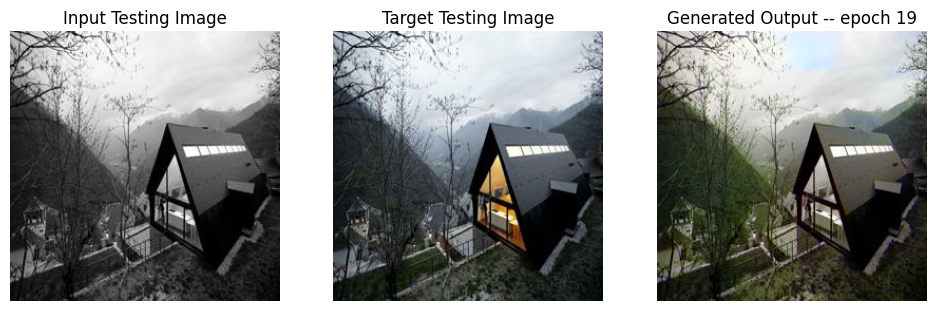

SSIM Score: 0.9645509123802185
PSNR Score: 27.120155334472656
Epoch 19
Training Details
Generator-- total_loss:24.35579 gan_loss:16.06973 l1_loss:0.04643 perceptual_loss:0.00881 Discriminator-- total_loss:0.00040 real_loss:0.00021 generated_loss:0.00019 --- SSIM 0.88324 PSNR 22.33307 LPIPS 0.00000
Time taken for epoch 20 is 995.1030735969543 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:10.02063 gan_loss:2.61467 l1_loss:0.04145  perceptual_loss:0.00793 Discriminator-- total_loss:4.34526 real_loss:1.69329 generated_loss:2.65197 --- SSIM 0.93226 PSNR 23.63556 LPIPS 0.00000
Time taken for epoch 20 is 1034.837223291397 sec
Number of iteration 63
Displaying one random test image...


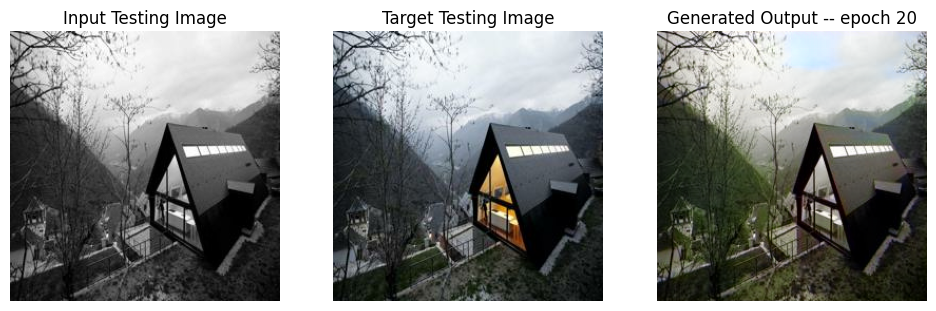

SSIM Score: 0.964703381061554
PSNR Score: 27.11162567138672
Epoch 20
Training Details
Generator-- total_loss:25.73217 gan_loss:17.43979 l1_loss:0.04647 perceptual_loss:0.00881 Discriminator-- total_loss:0.00003 real_loss:0.00001 generated_loss:0.00002 --- SSIM 0.88323 PSNR 22.33780 LPIPS 0.00000
Time taken for epoch 21 is 996.0728704929352 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:9.05361 gan_loss:1.59906 l1_loss:0.04168  perceptual_loss:0.00802 Discriminator-- total_loss:3.92670 real_loss:2.56817 generated_loss:1.35853 --- SSIM 0.93118 PSNR 23.54990 LPIPS 0.00000
Time taken for epoch 21 is 1035.5325791835785 sec
Number of iteration 63
Displaying one random test image...


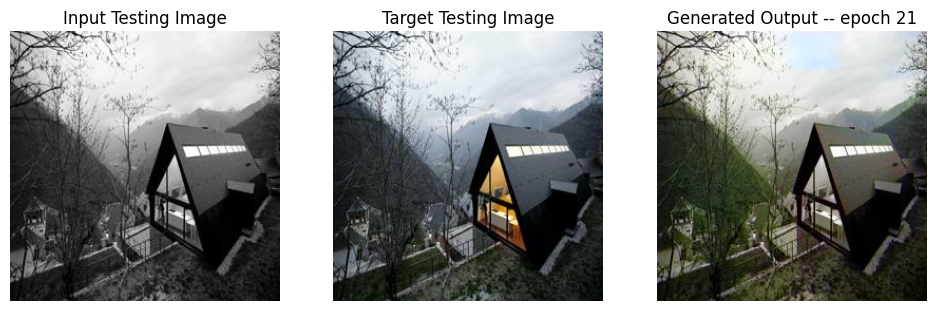

SSIM Score: 0.9645938873291016
PSNR Score: 27.112215042114258
Epoch 21
Training Details
Generator-- total_loss:24.24503 gan_loss:15.95079 l1_loss:0.04645 perceptual_loss:0.00884 Discriminator-- total_loss:0.16381 real_loss:0.10991 generated_loss:0.05390 --- SSIM 0.88177 PSNR 22.34697 LPIPS 0.00000
Time taken for epoch 22 is 997.7939069271088 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.68052 gan_loss:0.41780 l1_loss:0.04050  perceptual_loss:0.00791 Discriminator-- total_loss:8.86537 real_loss:8.09381 generated_loss:0.77155 --- SSIM 0.93348 PSNR 23.74360 LPIPS 0.00000
Time taken for epoch 22 is 1037.6156785488129 sec
Number of iteration 63
Displaying one random test image...


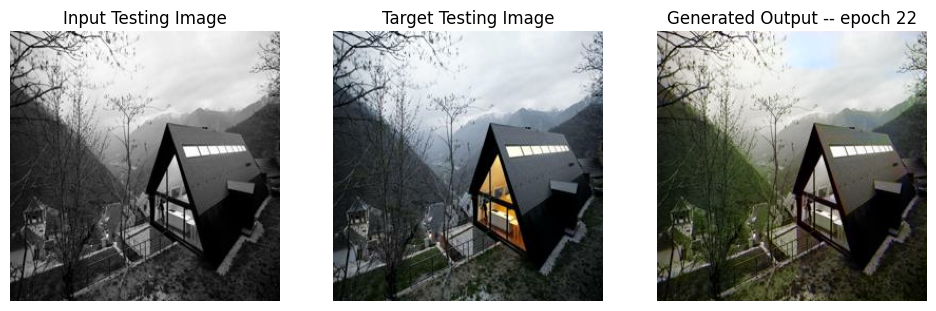

SSIM Score: 0.9642191529273987
PSNR Score: 27.08633804321289
Epoch 22
Training Details
Generator-- total_loss:25.49220 gan_loss:17.18969 l1_loss:0.04654 perceptual_loss:0.00881 Discriminator-- total_loss:0.01055 real_loss:0.00645 generated_loss:0.00410 --- SSIM 0.88227 PSNR 22.33375 LPIPS 0.00000
Time taken for epoch 23 is 992.2102394104004 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:13.71654 gan_loss:6.53015 l1_loss:0.03987  perceptual_loss:0.00804 Discriminator-- total_loss:9.18055 real_loss:2.77498 generated_loss:6.40557 --- SSIM 0.93550 PSNR 23.82562 LPIPS 0.00000
Time taken for epoch 23 is 1031.8420495986938 sec
Number of iteration 63
Displaying one random test image...


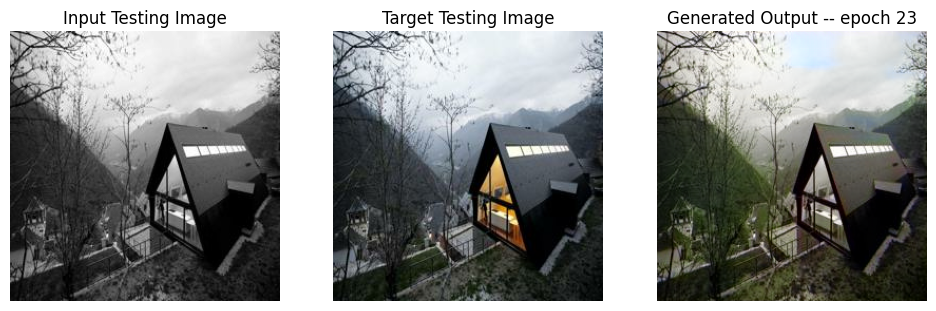

SSIM Score: 0.9656146168708801
PSNR Score: 27.20067596435547
Epoch 23
Training Details
Generator-- total_loss:35.43690 gan_loss:27.17289 l1_loss:0.04629 perceptual_loss:0.00881 Discriminator-- total_loss:0.00020 real_loss:0.00002 generated_loss:0.00018 --- SSIM 0.88194 PSNR 22.37272 LPIPS 0.00000
Time taken for epoch 24 is 998.168726682663 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:12.38399 gan_loss:4.82342 l1_loss:0.04236  perceptual_loss:0.00805 Discriminator-- total_loss:9.73363 real_loss:4.03814 generated_loss:5.69549 --- SSIM 0.93082 PSNR 23.56481 LPIPS 0.00000
Time taken for epoch 24 is 1037.5148046016693 sec
Number of iteration 63
Displaying one random test image...


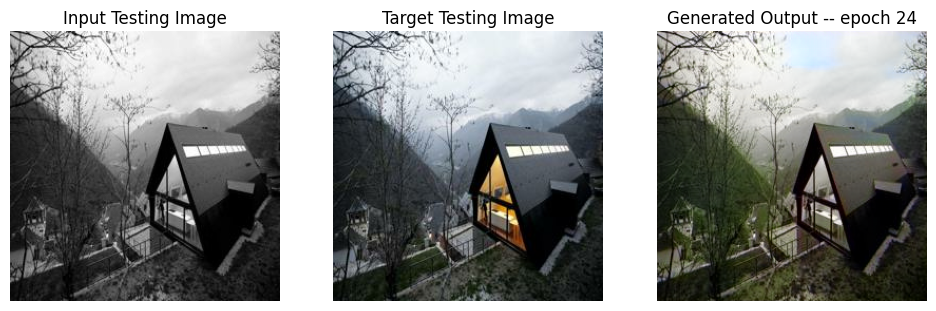

SSIM Score: 0.964521586894989
PSNR Score: 27.1001033782959
Epoch 24
Training Details
Generator-- total_loss:34.18324 gan_loss:25.88656 l1_loss:0.04647 perceptual_loss:0.00884 Discriminator-- total_loss:0.00004 real_loss:0.00001 generated_loss:0.00003 --- SSIM 0.88142 PSNR 22.35360 LPIPS 0.00000
Time taken for epoch 25 is 1009.8017017841339 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:10.34095 gan_loss:2.71852 l1_loss:0.04271  perceptual_loss:0.00811 Discriminator-- total_loss:11.76934 real_loss:6.54686 generated_loss:5.22249 --- SSIM 0.93080 PSNR 23.53839 LPIPS 0.00000
Time taken for epoch 25 is 1050.2258982658386 sec
Number of iteration 63
Displaying one random test image...


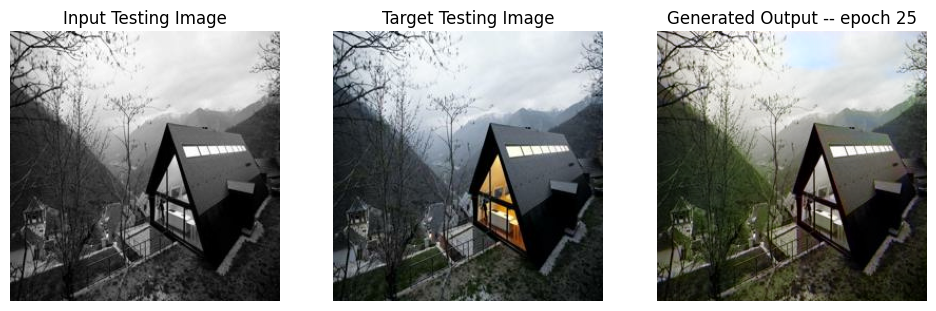

SSIM Score: 0.9643979072570801
PSNR Score: 27.112361907958984
Epoch 25
Training Details
Generator-- total_loss:32.56188 gan_loss:24.28179 l1_loss:0.04639 perceptual_loss:0.00881 Discriminator-- total_loss:0.00007 real_loss:0.00002 generated_loss:0.00005 --- SSIM 0.88298 PSNR 22.34274 LPIPS 0.00000
Time taken for epoch 26 is 1001.6656696796417 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.60723 gan_loss:1.00867 l1_loss:0.04261  perceptual_loss:0.00805 Discriminator-- total_loss:11.10816 real_loss:9.50615 generated_loss:1.60202 --- SSIM 0.92995 PSNR 23.49866 LPIPS 0.00000
Time taken for epoch 26 is 1041.3999001979828 sec
Number of iteration 63
Displaying one random test image...


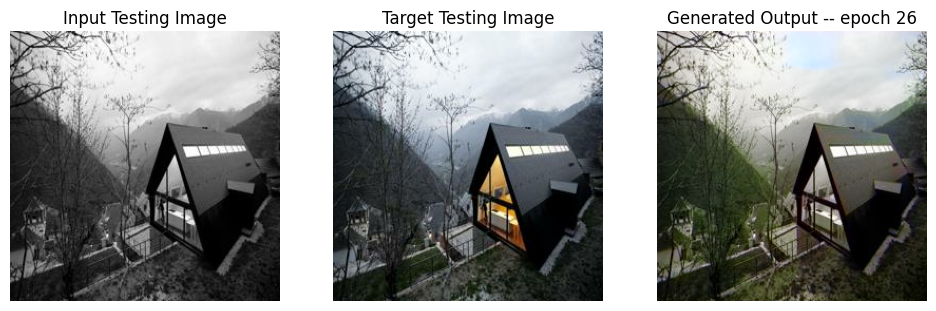

SSIM Score: 0.964713990688324
PSNR Score: 27.126855850219727
Epoch 26
Training Details
Generator-- total_loss:32.54633 gan_loss:24.26251 l1_loss:0.04641 perceptual_loss:0.00881 Discriminator-- total_loss:0.00000 real_loss:0.00000 generated_loss:0.00000 --- SSIM 0.88234 PSNR 22.35286 LPIPS 0.00000
Time taken for epoch 27 is 1006.997554063797 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.96884 gan_loss:1.42113 l1_loss:0.04238  perceptual_loss:0.00793 Discriminator-- total_loss:15.33701 real_loss:9.71619 generated_loss:5.62083 --- SSIM 0.92938 PSNR 23.59617 LPIPS 0.00000
Time taken for epoch 27 is 1046.145161151886 sec
Number of iteration 63
Displaying one random test image...


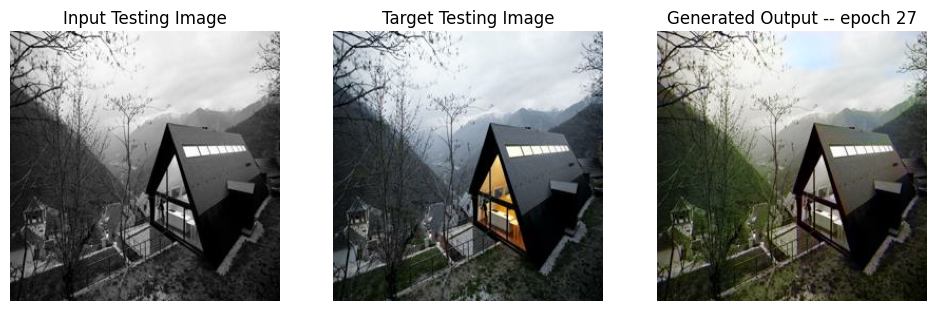

SSIM Score: 0.9639794230461121
PSNR Score: 27.07472801208496
Epoch 27
Training Details
Generator-- total_loss:38.58945 gan_loss:30.29238 l1_loss:0.04646 perceptual_loss:0.00886 Discriminator-- total_loss:0.10805 real_loss:0.07893 generated_loss:0.02912 --- SSIM 0.88221 PSNR 22.32734 LPIPS 0.00000
Time taken for epoch 28 is 1013.8818945884705 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.31303 gan_loss:0.85762 l1_loss:0.04201  perceptual_loss:0.00769 Discriminator-- total_loss:31.32701 real_loss:30.67156 generated_loss:0.65545 --- SSIM 0.93019 PSNR 23.57611 LPIPS 0.00000
Time taken for epoch 28 is 1053.3694081306458 sec
Number of iteration 63
Displaying one random test image...


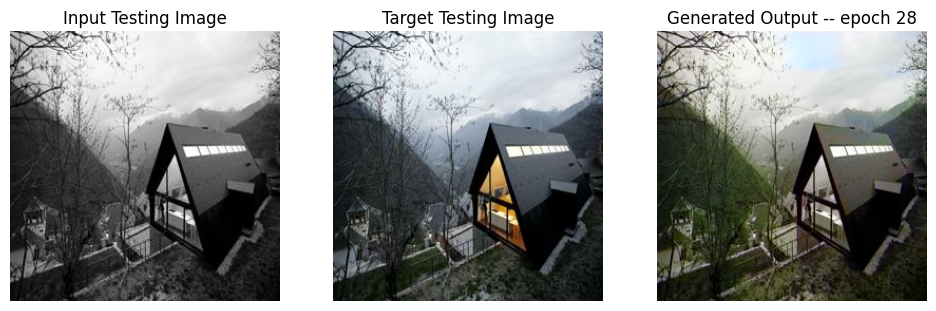

SSIM Score: 0.9635098576545715
PSNR Score: 27.0235538482666
Epoch 28
Training Details
Generator-- total_loss:41.03919 gan_loss:32.73194 l1_loss:0.04655 perceptual_loss:0.00883 Discriminator-- total_loss:0.00004 real_loss:0.00001 generated_loss:0.00003 --- SSIM 0.88168 PSNR 22.32859 LPIPS 0.00000
Time taken for epoch 29 is 1007.5013327598572 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.07766 gan_loss:0.51649 l1_loss:0.04218  perceptual_loss:0.00823 Discriminator-- total_loss:32.27687 real_loss:31.30056 generated_loss:0.97631 --- SSIM 0.93120 PSNR 23.51021 LPIPS 0.00000
Time taken for epoch 29 is 1047.2206811904907 sec
Number of iteration 63
Displaying one random test image...


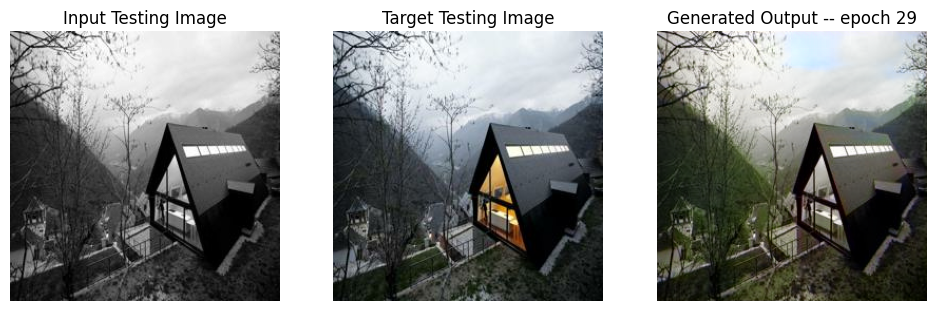

SSIM Score: 0.9642083644866943
PSNR Score: 27.05916404724121
Epoch 29
Training Details
Generator-- total_loss:41.70680 gan_loss:33.43632 l1_loss:0.04632 perceptual_loss:0.00882 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.88207 PSNR 22.35638 LPIPS 0.00000
Time taken for epoch 30 is 1011.1147694587708 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.54648 gan_loss:0.83049 l1_loss:0.04315  perceptual_loss:0.00829 Discriminator-- total_loss:35.32940 real_loss:32.93247 generated_loss:2.39693 --- SSIM 0.92942 PSNR 23.37311 LPIPS 0.00000
Time taken for epoch 30 is 1050.654801607132 sec
Number of iteration 63
Displaying one random test image...


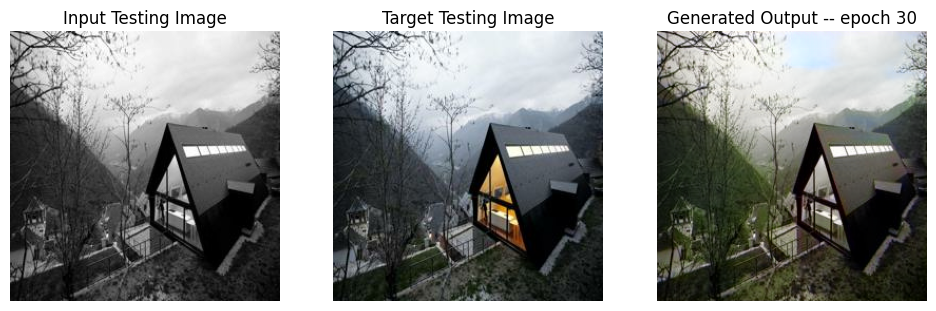

SSIM Score: 0.9657009243965149
PSNR Score: 27.187259674072266
Epoch 30
Training Details
Generator-- total_loss:41.52777 gan_loss:33.23582 l1_loss:0.04645 perceptual_loss:0.00883 Discriminator-- total_loss:0.00000 real_loss:0.00000 generated_loss:0.00000 --- SSIM 0.88154 PSNR 22.34424 LPIPS 0.00000
Time taken for epoch 31 is 1009.4068787097931 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.10958 gan_loss:0.74199 l1_loss:0.04126  perceptual_loss:0.00786 Discriminator-- total_loss:34.10220 real_loss:32.04350 generated_loss:2.05870 --- SSIM 0.93207 PSNR 23.61512 LPIPS 0.00000
Time taken for epoch 31 is 1048.538408279419 sec
Number of iteration 63
Displaying one random test image...


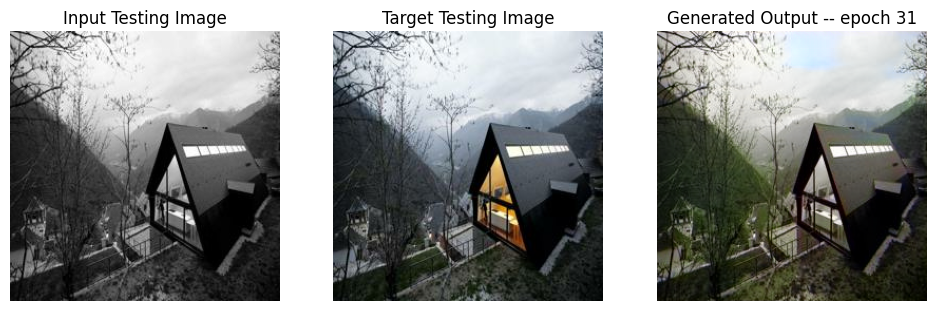

SSIM Score: 0.9649164080619812
PSNR Score: 27.145336151123047
Epoch 31
Training Details
Generator-- total_loss:41.33881 gan_loss:33.06458 l1_loss:0.04636 perceptual_loss:0.00880 Discriminator-- total_loss:0.04420 real_loss:0.02496 generated_loss:0.01923 --- SSIM 0.88235 PSNR 22.36044 LPIPS 0.00000
Time taken for epoch 32 is 1002.7692170143127 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.20865 gan_loss:0.69544 l1_loss:0.04201  perceptual_loss:0.00808 Discriminator-- total_loss:17.28446 real_loss:15.61355 generated_loss:1.67090 --- SSIM 0.93023 PSNR 23.51854 LPIPS 0.00000
Time taken for epoch 32 is 1042.359635591507 sec
Number of iteration 63
Displaying one random test image...


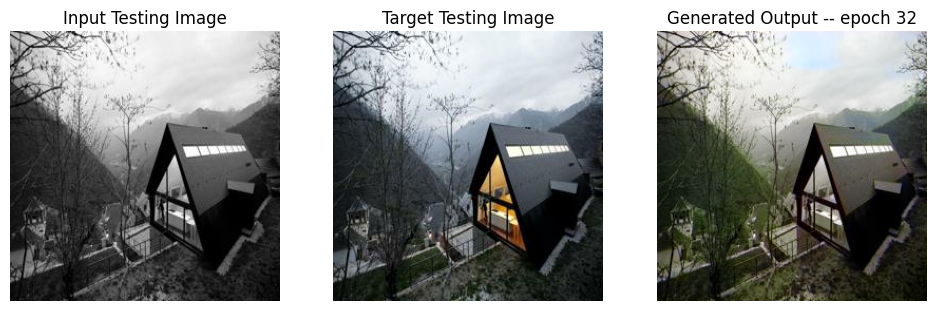

SSIM Score: 0.9646947979927063
PSNR Score: 27.115201950073242
Epoch 32
Training Details
Generator-- total_loss:40.19091 gan_loss:31.89073 l1_loss:0.04652 perceptual_loss:0.00882 Discriminator-- total_loss:0.00016 real_loss:0.00010 generated_loss:0.00005 --- SSIM 0.88170 PSNR 22.33350 LPIPS 0.00000
Time taken for epoch 33 is 1021.1057698726654 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.91656 gan_loss:0.45844 l1_loss:0.04186  perceptual_loss:0.00786 Discriminator-- total_loss:22.43569 real_loss:14.79792 generated_loss:7.63776 --- SSIM 0.93201 PSNR 23.63633 LPIPS 0.00000
Time taken for epoch 33 is 1062.3677229881287 sec
Number of iteration 63
Displaying one random test image...


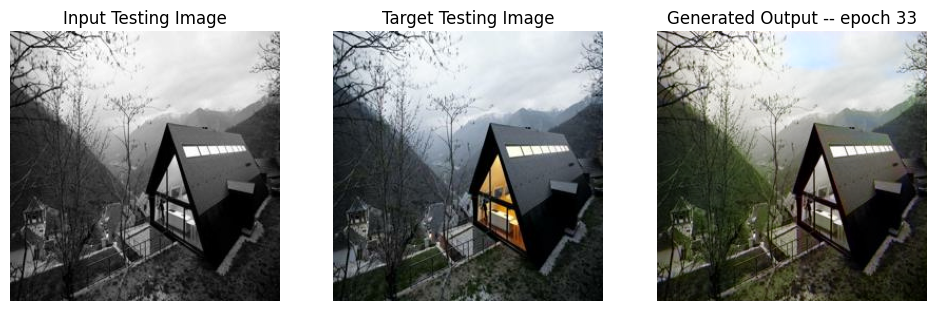

SSIM Score: 0.9647102355957031
PSNR Score: 27.120342254638672
Epoch 33
Training Details
Generator-- total_loss:41.43753 gan_loss:33.15514 l1_loss:0.04636 perceptual_loss:0.00885 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00000 --- SSIM 0.88221 PSNR 22.35334 LPIPS 0.00000
Time taken for epoch 34 is 1023.7947416305542 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:8.13695 gan_loss:0.67186 l1_loss:0.04186  perceptual_loss:0.00791 Discriminator-- total_loss:24.22049 real_loss:15.14167 generated_loss:9.07882 --- SSIM 0.93300 PSNR 23.45161 LPIPS 0.00000
Time taken for epoch 34 is 1064.8895316123962 sec
Number of iteration 63
Displaying one random test image...


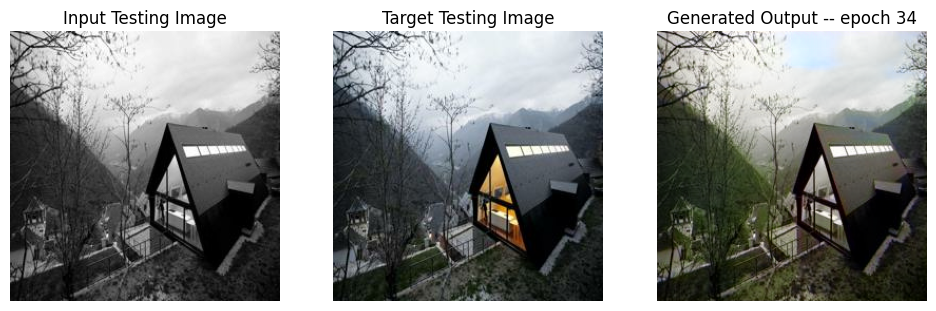

SSIM Score: 0.9645392298698425
PSNR Score: 27.101573944091797
Epoch 34
Training Details
Generator-- total_loss:41.51432 gan_loss:33.23933 l1_loss:0.04636 perceptual_loss:0.00881 Discriminator-- total_loss:0.00000 real_loss:0.00000 generated_loss:0.00000 --- SSIM 0.88242 PSNR 22.37051 LPIPS 0.00000
Time taken for epoch 35 is 1025.4730849266052 sec
Number of iteration 1250
Validation Details
Generator-- total_loss:7.99747 gan_loss:0.58927 l1_loss:0.04141  perceptual_loss:0.00798 Discriminator-- total_loss:23.80995 real_loss:15.40185 generated_loss:8.40810 --- SSIM 0.93199 PSNR 23.68501 LPIPS 0.00000
Time taken for epoch 35 is 1065.8083229064941 sec
Number of iteration 63
Displaying one random test image...


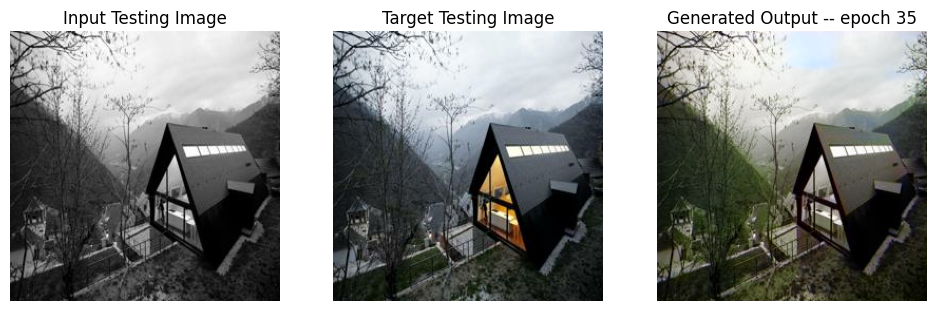

SSIM Score: 0.9646493792533875
PSNR Score: 27.115528106689453


In [55]:
fit(train_dataset, epochs, val, gen)

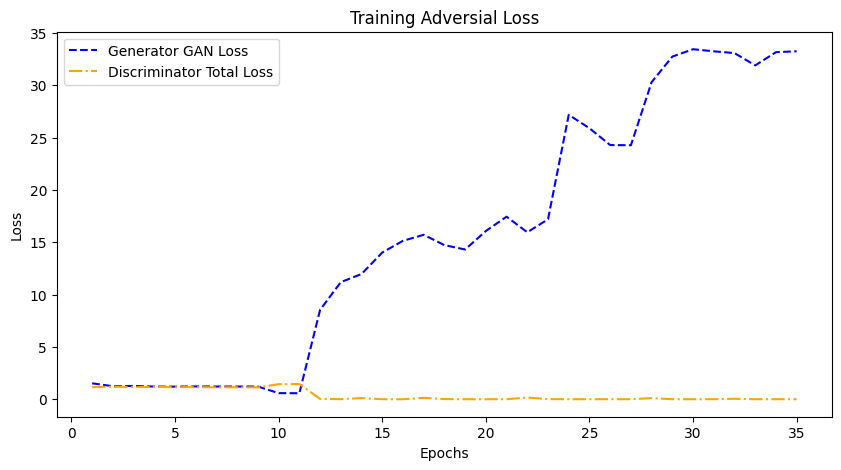

In [56]:
epochs = range(1, len(train_generator_losses) + 1)
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator GAN Loss')
plt.plot(epochs, train_discriminator_losses, '-.', color='orange', label='Discriminator Total Loss')
plt.title('Training Adversial Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

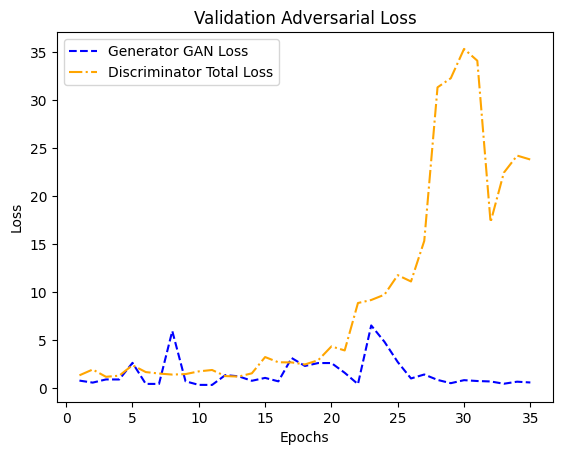

In [57]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator GAN Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Discriminator Total Loss')
plt.title('Validation Adversarial Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

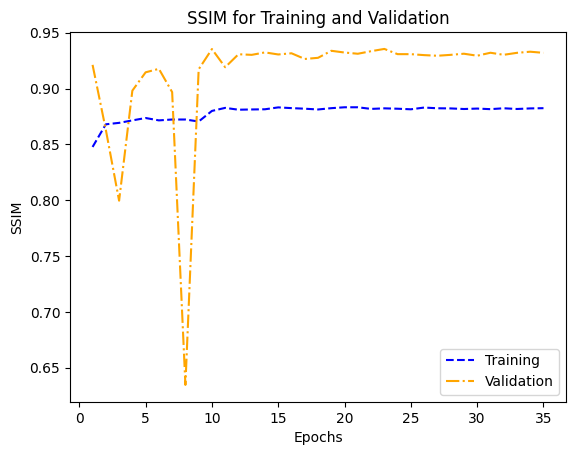

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training')
plt.plot(epochs, testing_ssim, '-.', color='orange', label='Validation')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

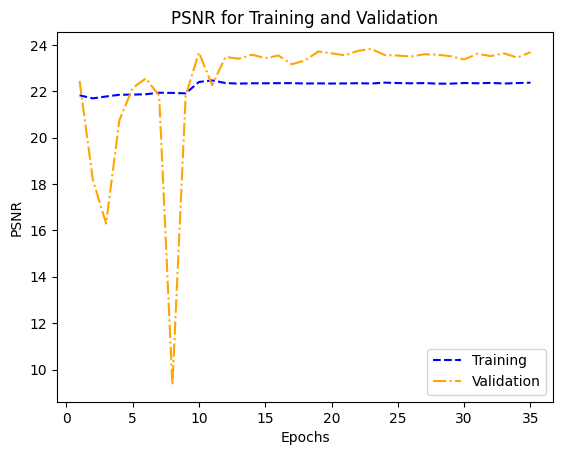

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training')
plt.plot(epochs, testing_psnr, '-.', color='orange', label='Validation')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

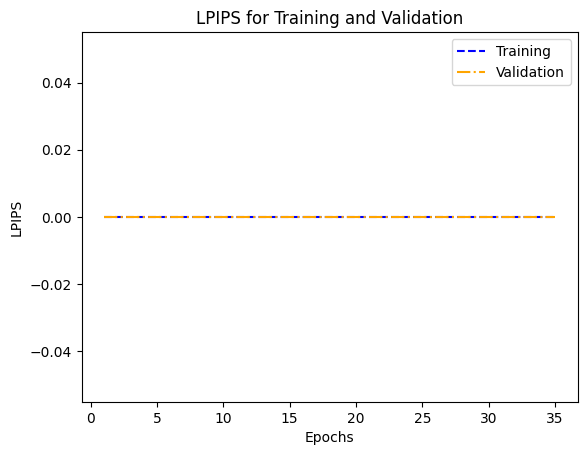

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training')
plt.plot(epochs, testing_lpips, '-.', color='orange', label='Validation')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

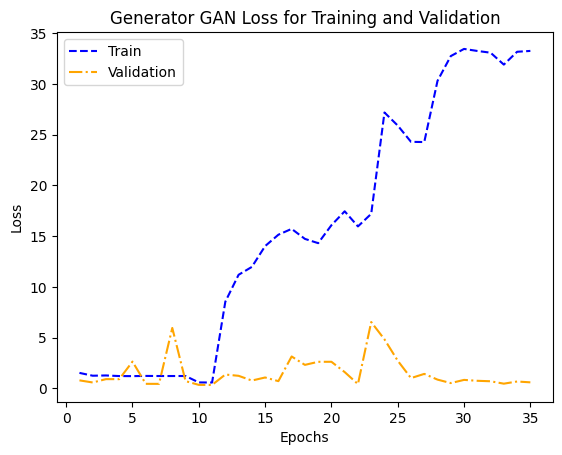

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train')
plt.plot(epochs, test_generator_gan_losses,'-.', color='orange', label='Validation')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

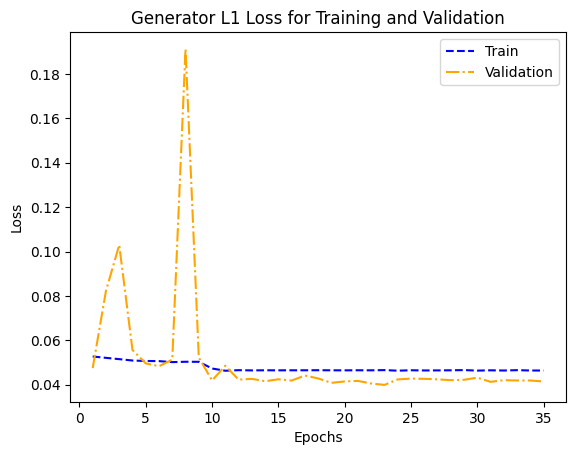

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train')
plt.plot(epochs, test_generator_l1_losses, '-.', color='orange', label='Validation')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

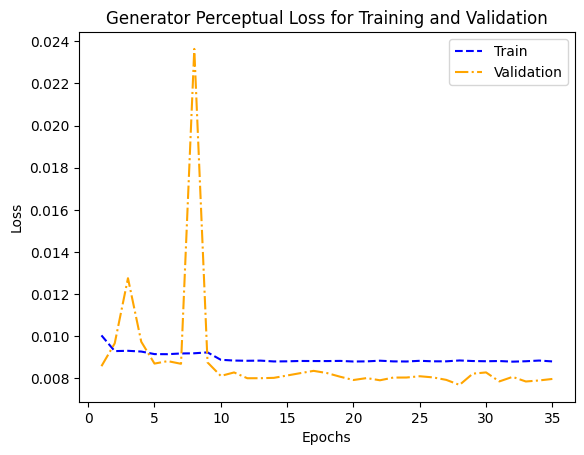

In [63]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train')
plt.plot(epochs, test_generator_perceptual_losses, '-.', color='orange', label='Validation')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

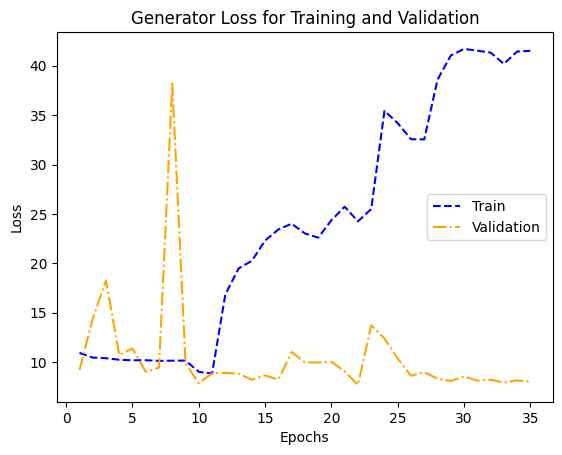

In [64]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train')
plt.plot(epochs, test_generator_losses, '-.', color='orange', label='Validation')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

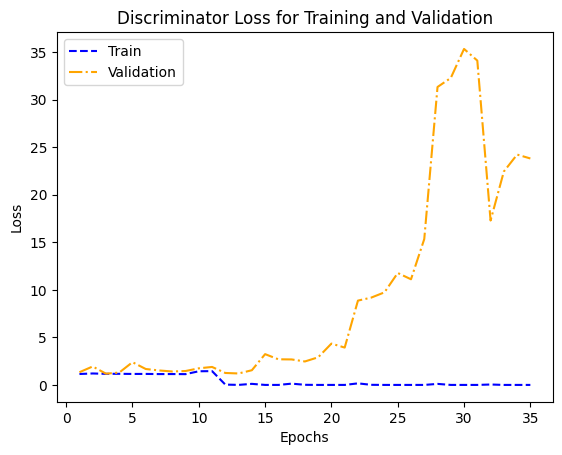

In [65]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Validation')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

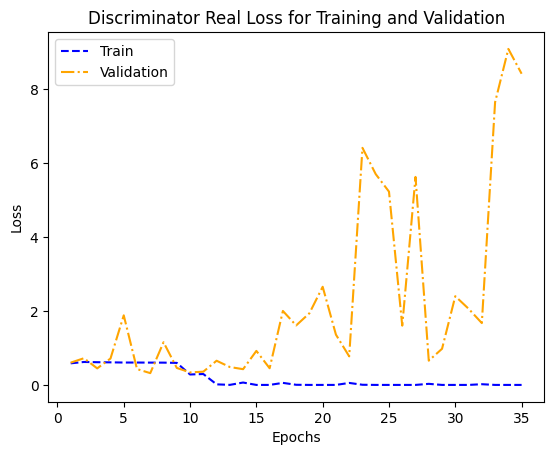

In [66]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_real_losses, '-.', color='orange', label='Validation')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

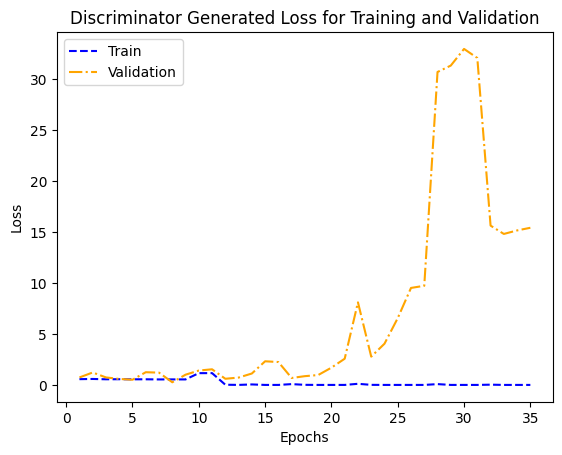

In [67]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_generated_losses,'-.', color='orange', label='Validation')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [68]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [69]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [70]:
# os.mkdir('/kaggle/working/modelsFeb7')

In [71]:
# gen.save('/kaggle/working/modelsFeb7/gen.h5')
# gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
# disc.save('/kaggle/working/modelsFeb7/disc.h5')
# disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')

In [72]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [73]:
import subprocess
from IPython.display import FileLink, display

In [74]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip